# Flavor Transformations

This notebook produces the figures in the SNEWPY paper showing the effect of the flavor transformation prescriptions upon the nakazato-shen-z0.004-t_rev100ms-s20.0 model 

In [14]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

from astropy import units as u 

from snewpy.neutrino import Flavor, MassHierarchy, MixingParameters
from snewpy.models import Nakazato_2013, Bollig_2016, Zha_2021
from snewpy.flavor_transformation import NoTransformation, CompleteExchange, AdiabaticMSW, NonAdiabaticMSWH, \
                                         TwoFlavorDecoherence, ThreeFlavorDecoherence, \
                                         NeutrinoDecay, AdiabaticMSWes, NonAdiabaticMSWes

mpl.rc('font', size=18)
%matplotlib inline

/var/folders/3t/mf2g60fx3nb49wp30kcwr8300000gn/T/ipykernel_96805/2230755518.py:8: FutureWarning: snewpy.models.Nakazato_2013 is moved to snewpy.models.ccsn.Nakazato_2013
  from snewpy.models import Nakazato_2013, Bollig_2016, Zha_2021
/var/folders/3t/mf2g60fx3nb49wp30kcwr8300000gn/T/ipykernel_96805/2230755518.py:8: FutureWarning: snewpy.models.Bollig_2016 is moved to snewpy.models.ccsn.Bollig_2016
  from snewpy.models import Nakazato_2013, Bollig_2016, Zha_2021
/var/folders/3t/mf2g60fx3nb49wp30kcwr8300000gn/T/ipykernel_96805/2230755518.py:8: FutureWarning: snewpy.models.Zha_2021 is moved to snewpy.models.ccsn.Zha_2021
  from snewpy.models import Nakazato_2013, Bollig_2016, Zha_2021


In [16]:
model = Nakazato_2013(progenitor_mass=20*u.solMass, revival_time=100*u.ms, metallicity=0.004, eos='shen')
#eos: equation of state, revival time: time the model goes over
model
model= Zha_2021
model

snewpy.models.ccsn.Zha_2021

## Transformed and untransformed energy integrated flux at Earth

Compute and plot the flux at Earth for a SN at 10 kpc with no flavor transformation, and with the chosen flavor transformation.

In [3]:
def plot_total_flux(model, xform_nmo, xform_imo):
    """Plot initial and oscillated neutrino luminosities.
    
    Parameters
    ----------
    model : SupernovaModel
        An input model from a CCSN simulation.
    flav_xform : FlavorTransformation
        A FlavorTransformation subclass; used to create an instance.
    """
    
    energies = np.linspace(0,60,121) * u.MeV    
    d = (10*u.kpc).to('cm').value # distance to SN
        
    times = model.get_time()
    burst_epoch = times <= 0.1*u.s
    accretion_epoch = (times > 0.1*u.s) & (times <= 0.5*u.s)
    cooling_epoch = (times > 0.5*u.s) & (times <= 10*u.s)
    
    ilum = {}
    olum_nmo = {}
    olum_imo = {}
    
    for flavor in Flavor:
        ilum[flavor] = np.zeros(len(times))
        olum_nmo[flavor] = np.zeros(len(times))
        olum_imo[flavor] = np.zeros(len(times))

    # Compute the transformed and untransformed flux at each time.
    for i, t in enumerate(times):
        ispec = model.get_initial_spectra(t, energies)
        ospec_nmo = model.get_transformed_spectra(t, energies, xform_nmo)
        ospec_imo = model.get_transformed_spectra(t, energies, xform_imo)

        for flavor in Flavor:
            for j, E in enumerate(energies):
                ispec[flavor][j] /= (4.*np.pi*d**2)
                ospec_nmo[flavor][j] /= (4.*np.pi*d**2)
                ospec_imo[flavor][j] /= (4.*np.pi*d**2)
        
        for flavor in Flavor:
            ilum[flavor][i] = np.trapz(ispec[flavor].to('1/(erg*s)'), energies.to('erg')).value 
            olum_nmo[flavor][i] = np.trapz(ospec_nmo[flavor].to('1/(erg*s)'), energies.to('erg')).value
            olum_imo[flavor][i] = np.trapz(ospec_imo[flavor].to('1/(erg*s)'), energies.to('erg')).value            
            
    # make the figures 
    fig, axes = plt.subplots(3,3, figsize=(20,12), tight_layout=True)
    
    smax = [0.,0.,0.]
    titles = ['Untransformed', 'Transformed (NMO)', 'Transformed (IMO)']
    for i, spec in enumerate([ilum, olum_nmo, olum_imo]):
        for j, phase in enumerate([burst_epoch, accretion_epoch, cooling_epoch]):
            ax = axes[i,j]
            timeunits = 'ms' if j==0 else 's'
                
            for flavor in Flavor:
                if i == 0:
                    smax[j] = np.maximum(smax[j], 1.1*np.max(spec[flavor][phase]))
                    
                ax.plot(times[phase].to(timeunits),
                        spec[flavor][phase], label=flavor.to_tex(), lw=3,
                        color='C0' if flavor.is_electron else 'C1',
                        ls='-' if flavor.is_neutrino else ':')
            
            ax.set(xlim=(times[phase][0].to(timeunits).value, times[phase][-1].to(timeunits).value),
                   ylim=(0, smax[j]))
            
            if j==0:
               ax.set(ylabel=r'flux [$10^{16}$ erg$^{-1}$ cm$^{-2}$ s$^{-1}$]')
               ax.legend(loc='upper right', ncol=1, fontsize=18)
            if j==1:
                ax.set(title=titles[i])
            if i < 2:
                ax.set(xticklabels=[])
            else:
                ax.set(xlabel='time [{}]'.format(timeunits))
            
            ax.grid(ls=':')

      
    return fig#,times,ilum,olum_nmo,olum_imo - for contour plot attempt but abandoned

## Untransformed and Transformed Spectra at Earth

Compute and plot the spectra at Earth for a SN at 10 kpc with no flavor transformation, and with the chosen flavor transformation.

In [4]:
def plot_spectra(model, xform_nmo, xform_imo, t):
    """Plot initial and oscillated neutrino luminosities.
    
    Parameters
    ----------
    model : SupernovaModel
        An input model from a CCSN simulation.
    flav_xform : FlavorTransformation
        A FlavorTransformation subclass; used to create an instance.
    t : astropy.Quantity
        Time to compute the spectrum.
    """

    energies = np.linspace(0,60,121) * u.MeV   
    d = (10*u.kpc).to('cm').value # distance to SN

    #get the spectra
    ispec = model.get_initial_spectra(t, energies) 
    ospec_nmo = model.get_transformed_spectra(t, energies, xform_nmo)
    ospec_imo = model.get_transformed_spectra(t, energies, xform_imo)

    for flavor in Flavor:
        for j, E in enumerate(energies):
            ispec[flavor][j] /= (4.*np.pi*d**2)
            ospec_nmo[flavor][j] /= (4.*np.pi*d**2)
            ospec_imo[flavor][j] /= (4.*np.pi*d**2)
    
    fig, axes = plt.subplots(2,2, figsize=(18,15), sharex=True, sharey=True, tight_layout=True)

    for i, spec in enumerate([ispec, ospec_nmo]):
        axes[0][0].plot(energies, spec[Flavor.NU_E]/1e16, 
                    label='Untransformed '+Flavor.NU_E.to_tex() if i==0 else 'Transformed '+Flavor.NU_E.to_tex(),
                    color='C0', ls='-' if i==0 else ':', lw=2,  alpha=0.7)
        axes[0][0].plot(energies, spec[Flavor.NU_X]/1e16, 
                    label='Untransformed '+Flavor.NU_X.to_tex() if i==0 else 'Transformed '+Flavor.NU_X.to_tex(),
                    color='C1', ls='-' if i==0 else ':', lw=2,  alpha=0.7)

        axes[0][0].set(title='Neutrinos in the NMO: $t = ${:.1f}'.format(t))
        axes[0][0].grid()
        axes[0][0].legend(loc='upper right', ncol=2, fontsize=16)
    
        axes[0][1].plot(energies, spec[Flavor.NU_E_BAR]/1e16, 
                    label='Untransformed '+Flavor.NU_E_BAR.to_tex() if i==0 else 'Transformed '+Flavor.NU_E_BAR.to_tex(),
                    color='C0', ls='-' if i==0 else ':', lw=2,  alpha=0.7)
        axes[0][1].plot(energies, spec[Flavor.NU_X_BAR]/1e16, 
                    label='Untransformed '+Flavor.NU_X_BAR.to_tex() if i==0 else 'Transformed '+Flavor.NU_X_BAR.to_tex(),
                    color='C1', ls='-' if i==0 else ':', lw=2,  alpha=0.7)

        axes[0][1].set(title='Antineutrinos in the NMO: $t = ${:.1f}'.format(t)) 
        axes[0][1].grid()
        axes[0][1].legend(loc='upper right', ncol=2, fontsize=16)    
    
    for i, spec in enumerate([ispec, ospec_imo]):
        axes[1][0].plot(energies, spec[Flavor.NU_E]/1e16, 
                    label='Untransformed '+Flavor.NU_E.to_tex() if i==0 else 'Transformed '+Flavor.NU_E.to_tex(),
                    color='C0', ls='-' if i==0 else ':', lw=2,  alpha=0.7)
        axes[1][0].plot(energies, spec[Flavor.NU_X]/1e16, 
                    label='Untransformed '+Flavor.NU_X.to_tex() if i==0 else 'Transformed '+Flavor.NU_X.to_tex(),
                    color='C1', ls='-' if i==0 else ':', lw=2,  alpha=0.7)

        axes[1][0].set(xlabel=r'$E$ [{}]'.format(energies.unit), title='Neutrinos in the IMO: $t = ${:.1f}'.format(t))
        axes[1][0].grid()
        axes[1][0].legend(loc='upper right', ncol=2, fontsize=16)
    
        axes[1][1].plot(energies, spec[Flavor.NU_E_BAR]/1e16, 
                    label='Untransformed '+Flavor.NU_E_BAR.to_tex() if i==0 else 'Transformed '+Flavor.NU_E_BAR.to_tex(),
                    color='C0', ls='-' if i==0 else ':', lw=2,  alpha=0.7)
        axes[1][1].plot(energies, spec[Flavor.NU_X_BAR]/1e16, 
                    label='Untransformed '+Flavor.NU_X_BAR.to_tex() if i==0 else 'Transformed '+Flavor.NU_X_BAR.to_tex(),
                    color='C1', ls='-' if i==0 else ':', lw=2,  alpha=0.7)

        axes[1][1].set(xlabel=r'$E$ [{}]'.format(energies.unit), title='Antineutrinos in the IMO: $t = ${:.1f}'.format(t))
        axes[1][1].grid()
        axes[1][1].legend(loc='upper right', ncol=2, fontsize=18)    

    ax = axes[0][0]
    ax.set(ylabel=r'flux [$10^{16}$ erg$^{-1}$ cm$^{-2}$ s$^{-1}$]')
    ax = axes[1][0]
    ax.set(ylabel=r'flux [$10^{16}$ erg$^{-1}$ cm$^{-2}$ s$^{-1}$]')
    
    return fig

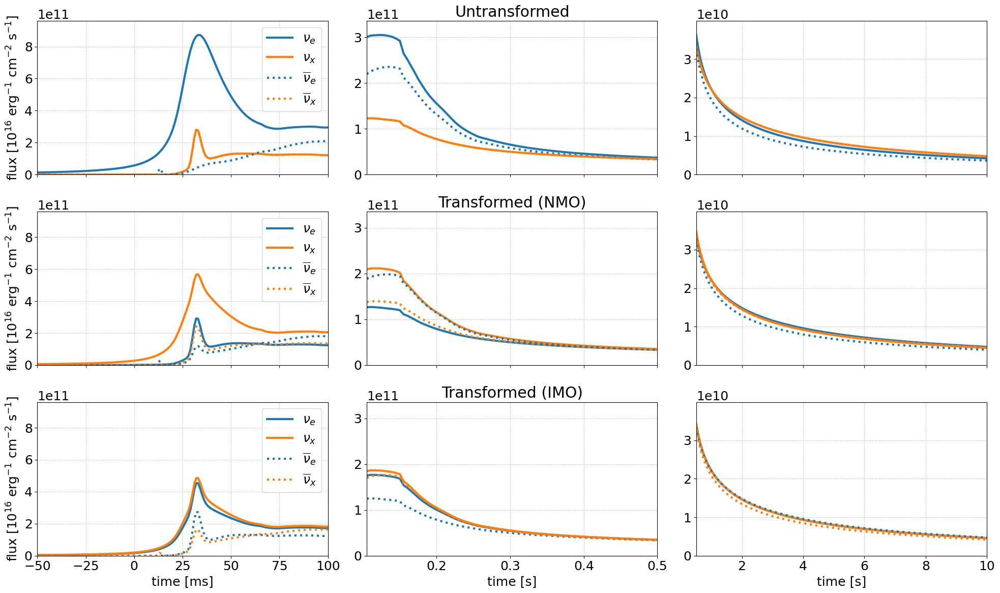

In [5]:
fig = plot_total_flux(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED) )
#fig.savefig('flux_adiabaticmsw.pdf')

#rows: no flavor transformation, and the with the chosen flavor transformation

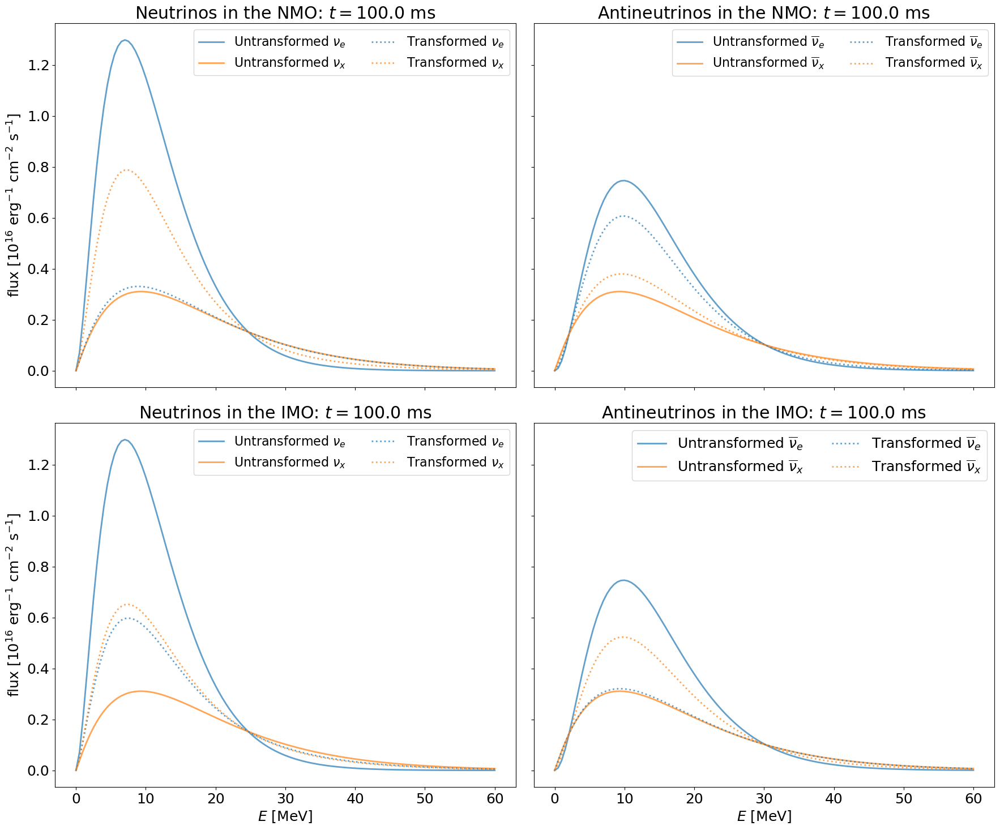

In [6]:
fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 100*u.ms)
#fig.savefig('spectra_adiabaticmsw.pdf')

#rows: no flavor transformation, and the with the chosen flavor transformation

In [7]:
mp_nmo = MixingParameters()
angles_nmo = mp_nmo.get_mixing_angles() + (10*u.deg,)
xf_nmo = AdiabaticMSWes(angles_nmo)

mp_imo = MixingParameters(mh=MassHierarchy.INVERTED)
angles_imo = mp_imo.get_mixing_angles() + (10*u.deg,)
xf_imo = AdiabaticMSWes(angles_imo)


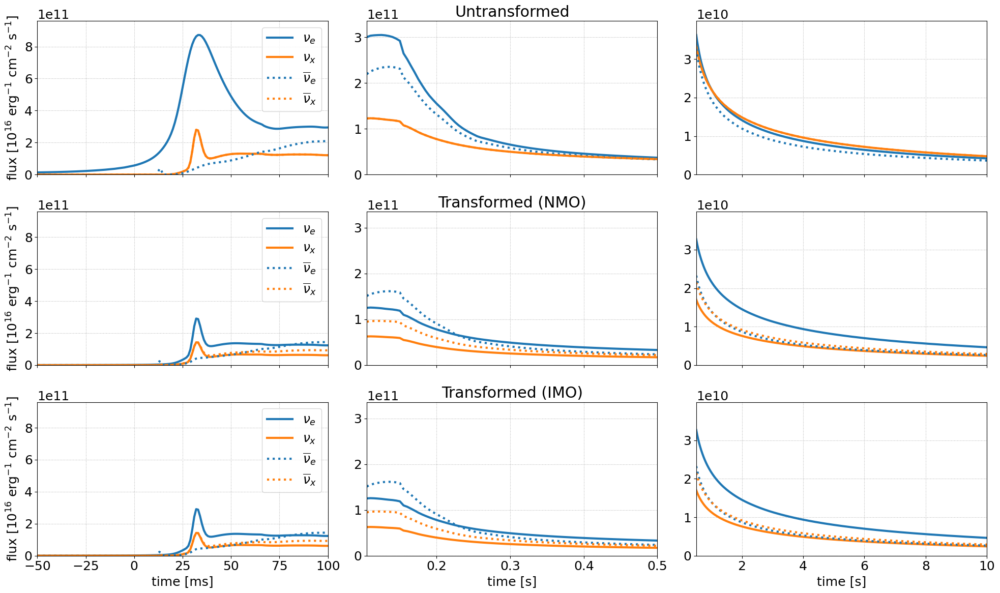

In [8]:
fig = plot_total_flux(model, xf_nmo, xf_imo)
#fig.savefig('flux_adiabaticmswes.pdf')

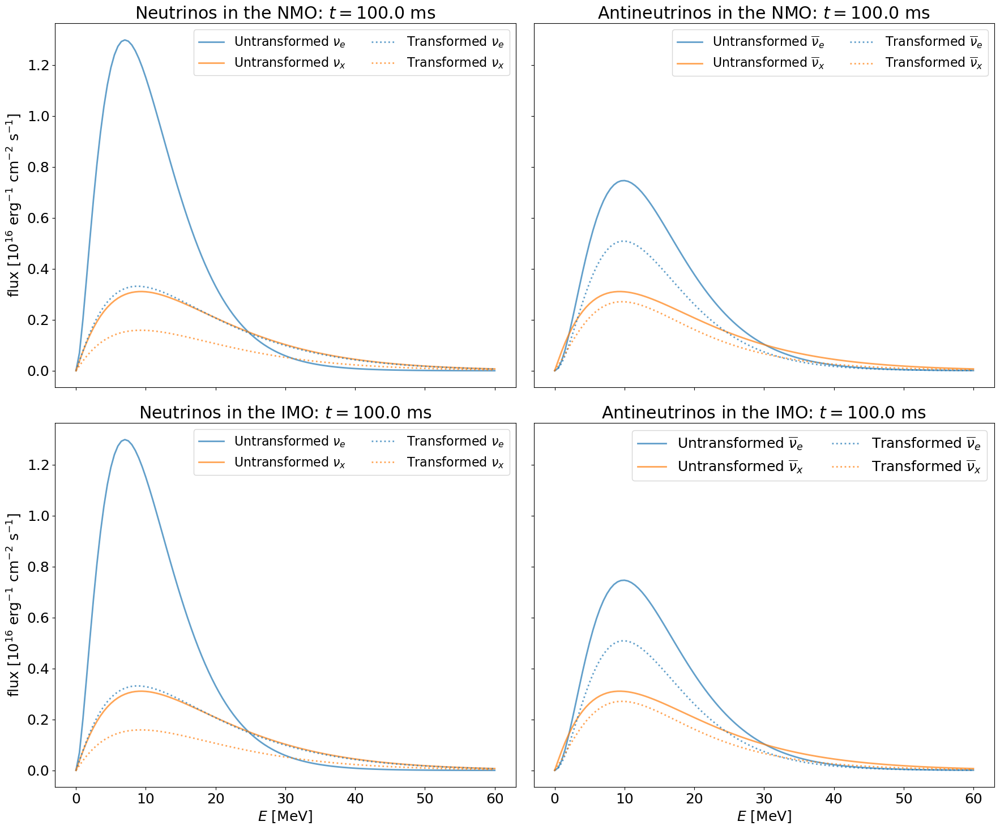

In [10]:
fig = plot_spectra(model, xf_nmo, xf_imo, 100*u.ms)
#fig.savefig('spectra_adiabaticmswes.pdf')

# MY WORK:

Text(0.5, 0.01, 'Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity')

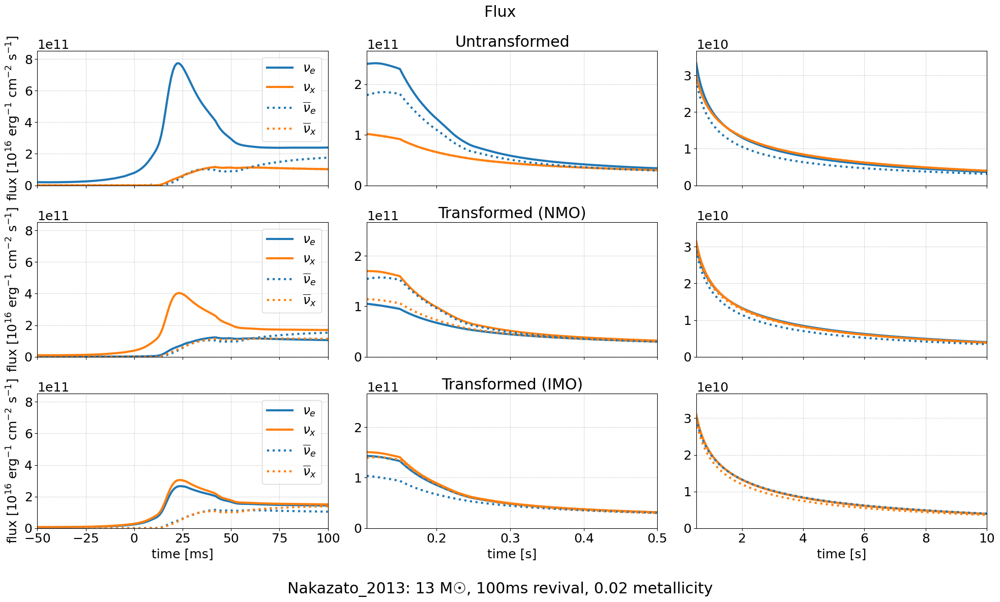

In [9]:
# plotting flux as a function of time:

#get the supernova model - vary star mass, rev time, metal, to change the star we're modelling
#model = Bollig_2016(progenitor_mass=27*u.solMass)
model = Nakazato_2013(progenitor_mass=13*u.solMass, revival_time=100*u.ms, metallicity=0.02, eos='shen')

#vary flavour transformation scenarios 
    # - can set the mixing angles or use default in the form (theta12, theta13, theta23)
#is inverted mass heirarchy for antineutrinos?

#we are dealing here with two flavour mixing: e neutrinos and x neutrinos (x = muon + tau)
fig = plot_total_flux(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED)) 
fig.suptitle("Flux")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")

#each column corresponds to the burst epoch, accretion epoch, and cooling epoch

#fig.savefig('flux_AdiabaticMSW_1.pdf')

Text(0.5, 0.01, 'Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity')

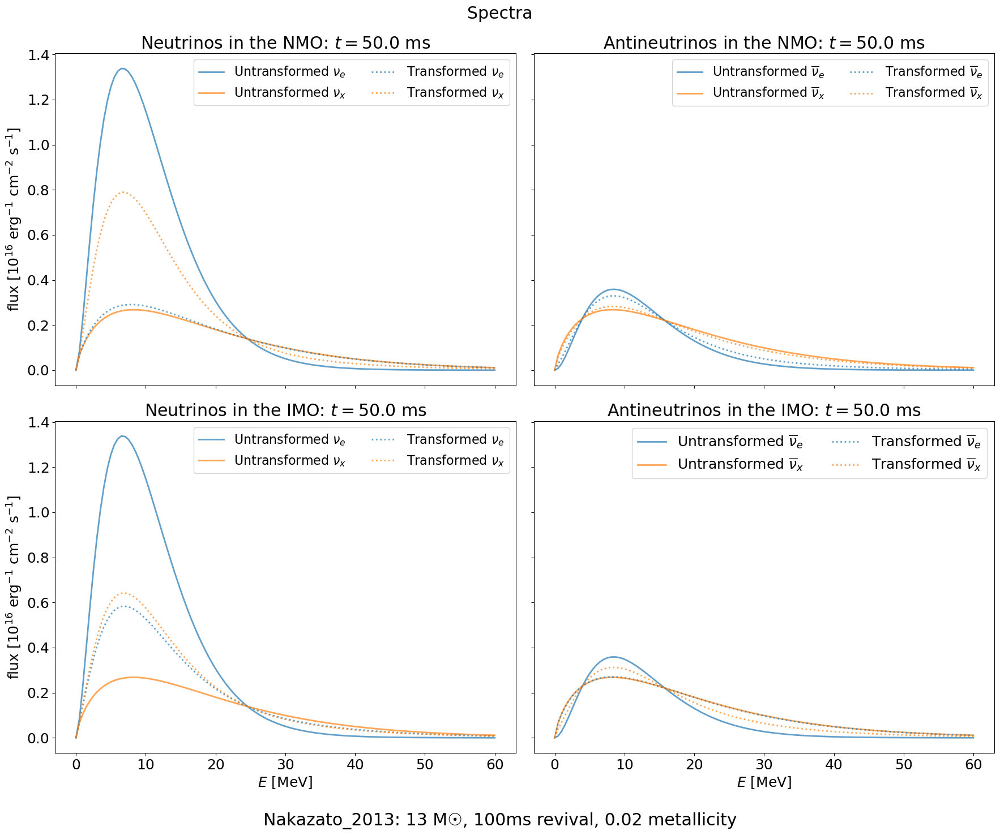

In [10]:
# plotting characteristic(?) spectra after a flavour transform [flux as a function of energy at a set time]:

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 50*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")

#fig.savefig('spectra_AdiabaticMSW_1.pdf')

In [11]:
#plotting a contour plot of energy flux and time - ABANDONED
'''
def function(x, y):
    return np.sin(np.sqrt(x ** 2 + y ** 2))

fig,times,ilum,olum_nmo,olum_imo = plot_total_flux(model, xf_nmo, xf_imo)

x = times
y = [ilum[0],ilum[1],ilum[2],ilum[3]]

X, Y = np.meshgrid(x, y)

Z = function(X, Y)
 
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection='3d')
 
ax.plot_surface(X, Y, Z, cmap='cool', alpha=0.8)
 
ax.set_title('3D Contour Plot of function(x, y) =\
                sin(sqrt(x^2 + y^2))', fontsize=14)
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('y', fontsize=12)
ax.set_zlabel('z', fontsize=12)
 
plt.show()
'''

"\ndef function(x, y):\n    return np.sin(np.sqrt(x ** 2 + y ** 2))\n\nfig,times,ilum,olum_nmo,olum_imo = plot_total_flux(model, xf_nmo, xf_imo)\n\nx = times\ny = [ilum[0],ilum[1],ilum[2],ilum[3]]\n\nX, Y = np.meshgrid(x, y)\n\nZ = function(X, Y)\n \nfig = plt.figure(figsize=(10, 8))\nax = plt.axes(projection='3d')\n \nax.plot_surface(X, Y, Z, cmap='cool', alpha=0.8)\n \nax.set_title('3D Contour Plot of function(x, y) =                sin(sqrt(x^2 + y^2))', fontsize=14)\nax.set_xlabel('x', fontsize=12)\nax.set_ylabel('y', fontsize=12)\nax.set_zlabel('z', fontsize=12)\n \nplt.show()\n"

In [12]:
#Trying to get event rates:

#model = Bollig_2016(progenitor_mass=27*u.solMass)
model = Nakazato_2013(progenitor_mass=13*u.solMass, revival_time=100*u.ms, metallicity=0.02, eos='shen')

#define the sampling points
energy = np.linspace(0,100,51)<<u.MeV
time = np.linspace(0,10,1000)<<u.s

#calculate the flux
flux = model.get_flux(time, energy, distance=10<<u.kpc, flavor_xform=AdiabaticMSW())
#print(flux.shape)

#optionally: integrate the flux over time bins to obtain the fluence
fluence = flux.integrate('time', limits=np.linspace(0,1,21)<<u.s)
#print(fluence.shape)

#calculate the event rates using the RateCalculator
from snewpy.rate_calculator import RateCalculator
rc = RateCalculator()
event_rates = rc.run(fluence, detector='km3net') #select the detector/material, whether to account for effects, etc
ibd_rate = event_rates['ibd'] #will be also a Container instance
#print(ibd_rate)

#get the total values vs. time bin
N_ibd_vs_T = ibd_rate.sum('energy')
#or total values vs. energy bin
N_ibd_vs_E = ibd_rate.sum('time')
#or total number of interactions
N_ibd_tot = ibd_rate.sum('time').sum('energy')
#to retrieve the number we can access the `array` member
print(N_ibd_vs_T.array.squeeze().shape)
print(N_ibd_vs_E.array.squeeze().shape)

print(N_ibd_tot.array.squeeze()) #314074.77180403896


Using snowglobes_data module ...
(20,)
(200,)
9999.346951153426


/Users/jannahelgendy/opt/anaconda3/lib/python3.9/site-packages/snewpy/rate_calculator.py:42: RuntimeWarning: divide by zero encountered in log
  xsecs = np.interp(np.log(E)/np.log(10), xp, yp, left=0, right=0)*E*1e-38 <<u.cm**2


In [76]:
#trying to plot event rates - ABANDONED

#plt.plot(np.linspace(0,10,1000)<<u.s, N_ibd_vs_T.array.squeeze())

In [86]:
#adding mixing angles - we ojnly care about using adiabatic msw so we can skip this step and use the default mixing anglesd

mp_nmo = MixingParameters()
angles_nmo = mp_nmo.get_mixing_angles()
print(angles_nmo)
xf_nmo = AdiabaticMSW(angles_nmo)

mp_imo = MixingParameters(mh=MassHierarchy.INVERTED)
angles_imo = mp_imo.get_mixing_angles()
print(angles_imo)
xf_imo = AdiabaticMSW(angles_imo)


(<Quantity 33.44 deg>, <Quantity 8.57 deg>, <Quantity 49.2 deg>)
(<Quantity 33.45 deg>, <Quantity 8.6 deg>, <Quantity 49.3 deg>)


In [136]:
#plotting same graphs again - these don't seem right? check with francesca

fig = plot_total_flux(model, xf_nmo, xf_imo)

fig.suptitle("Flux")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")

#fig.savefig('flux_AdiabaticMSW_with_mixing_1.pdf')


'\nfig = plot_total_flux(model, xf_nmo, xf_imo)\n\nfig.suptitle("Flux")\nfig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")\n\n#fig.savefig(\'flux_AdiabaticMSW_with_mixing_1.pdf\')\n'

In [137]:
'''
fig = plot_spectra(model, xf_nmo, xf_imo, 50*u.ms)

fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")

#fig.savefig('spectra_AdiabaticMSW_with_mixing_1.pdf')
'''

'\nfig = plot_spectra(model, xf_nmo, xf_imo, 50*u.ms)\n\nfig.suptitle("Spectra")\nfig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")\n\n#fig.savefig(\'spectra_AdiabaticMSW_with_mixing_1.pdf\')\n'

/var/folders/3t/mf2g60fx3nb49wp30kcwr8300000gn/T/ipykernel_40672/680728642.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(2,2, figsize=(18,15), sharex=True, sharey=True, tight_layout=True)


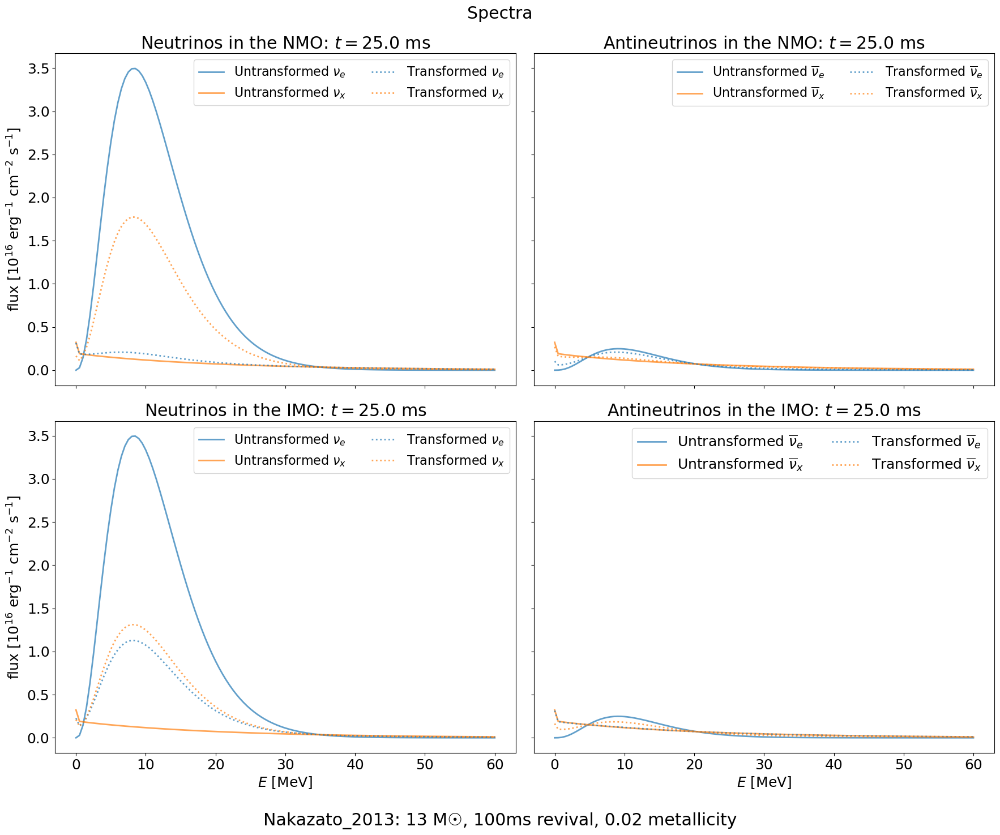

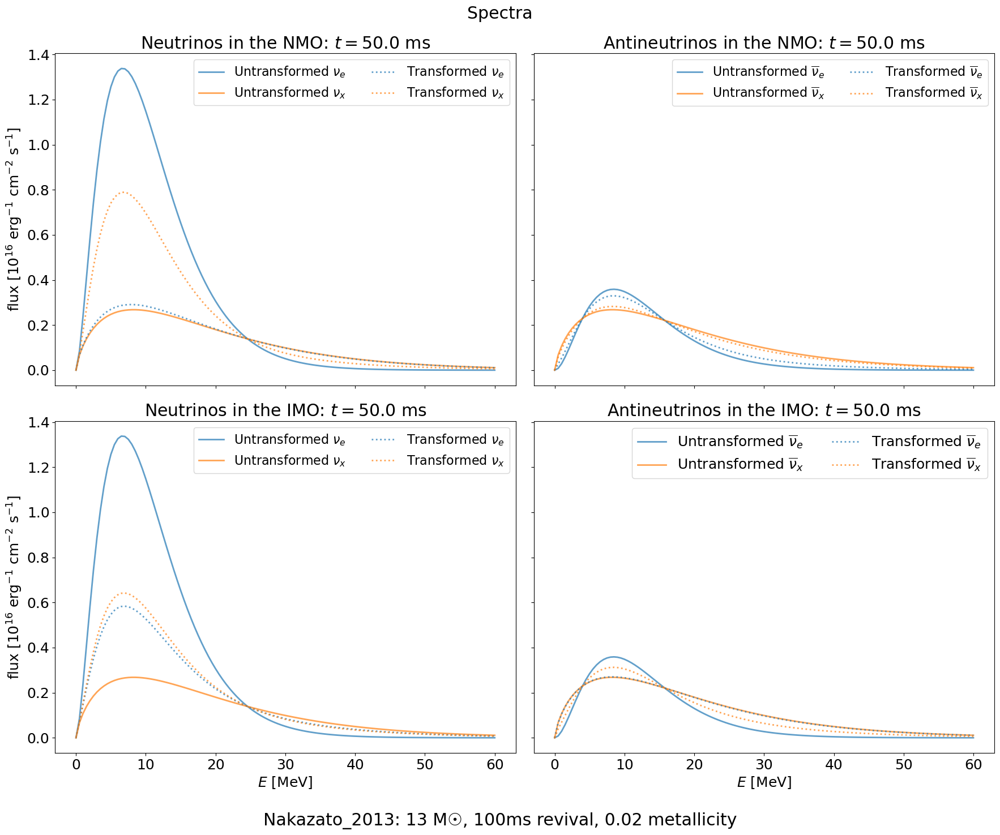

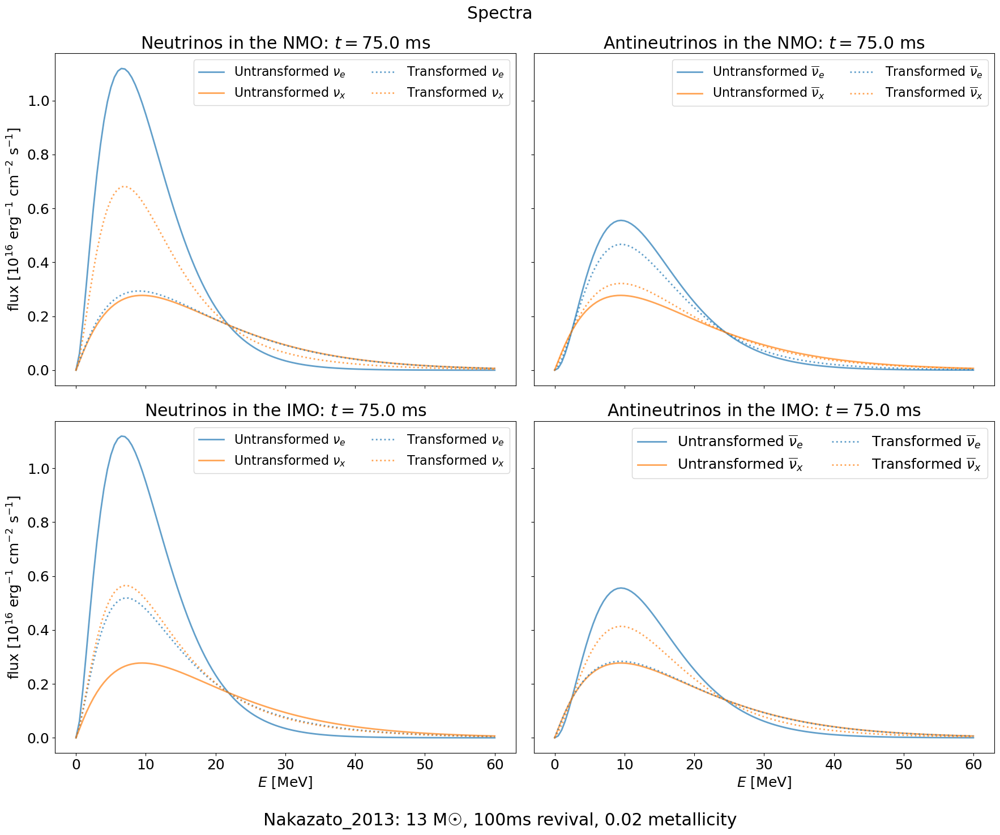

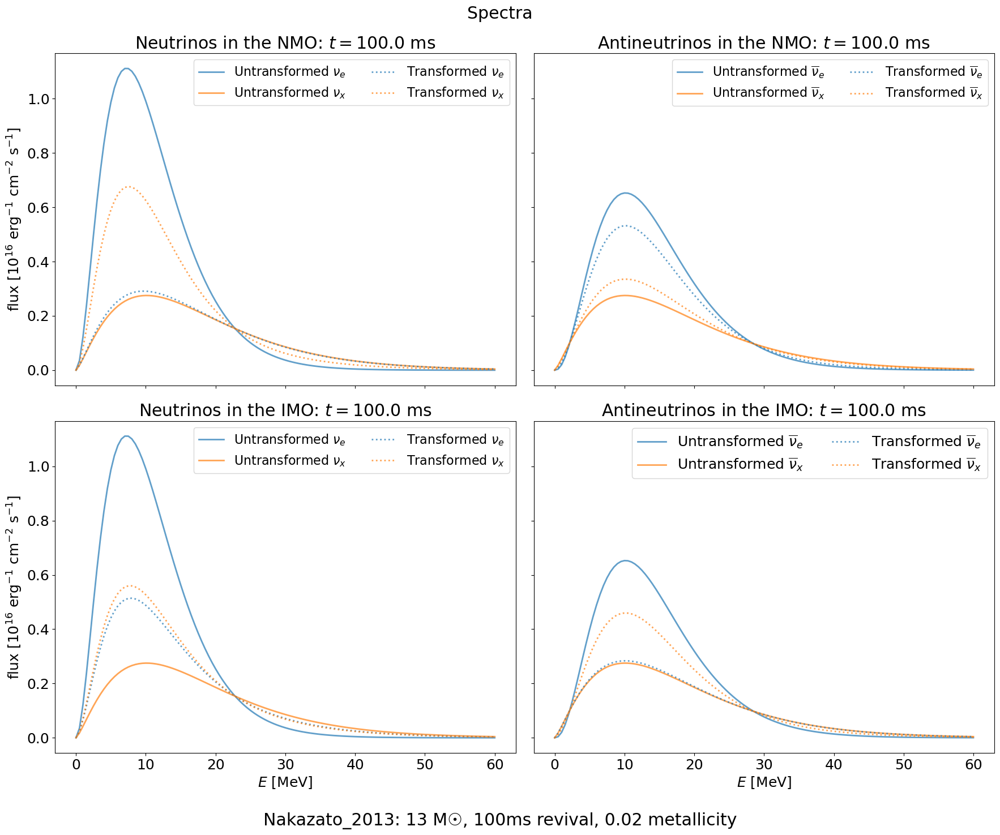

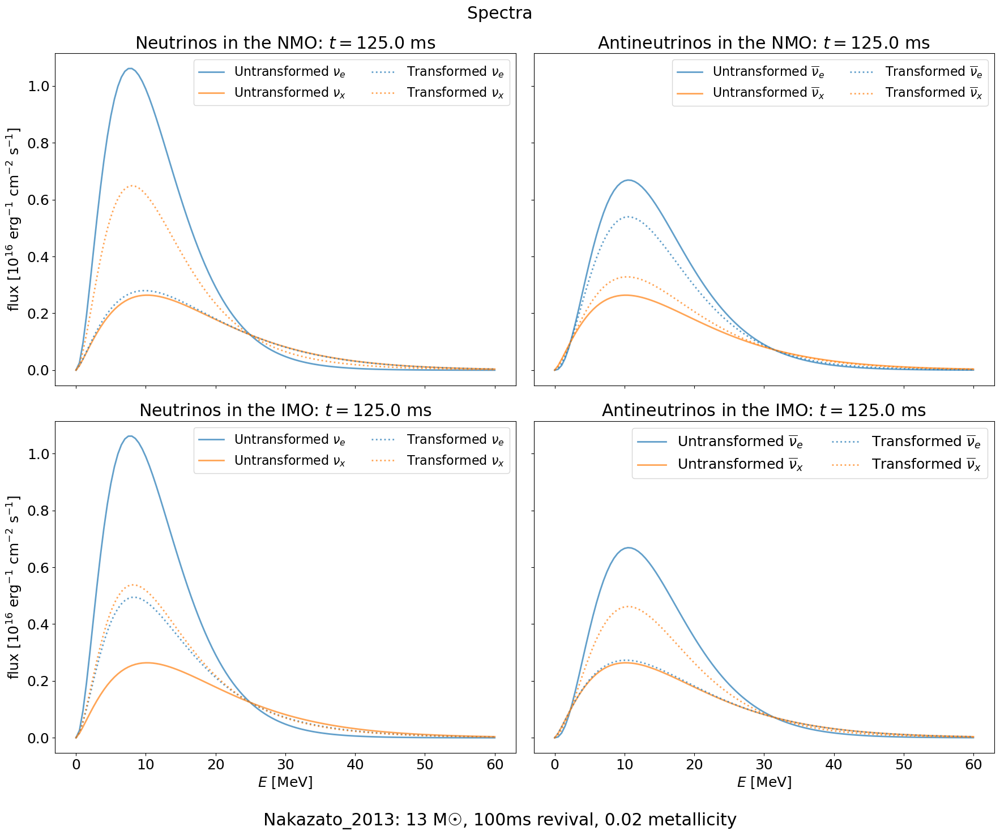

...

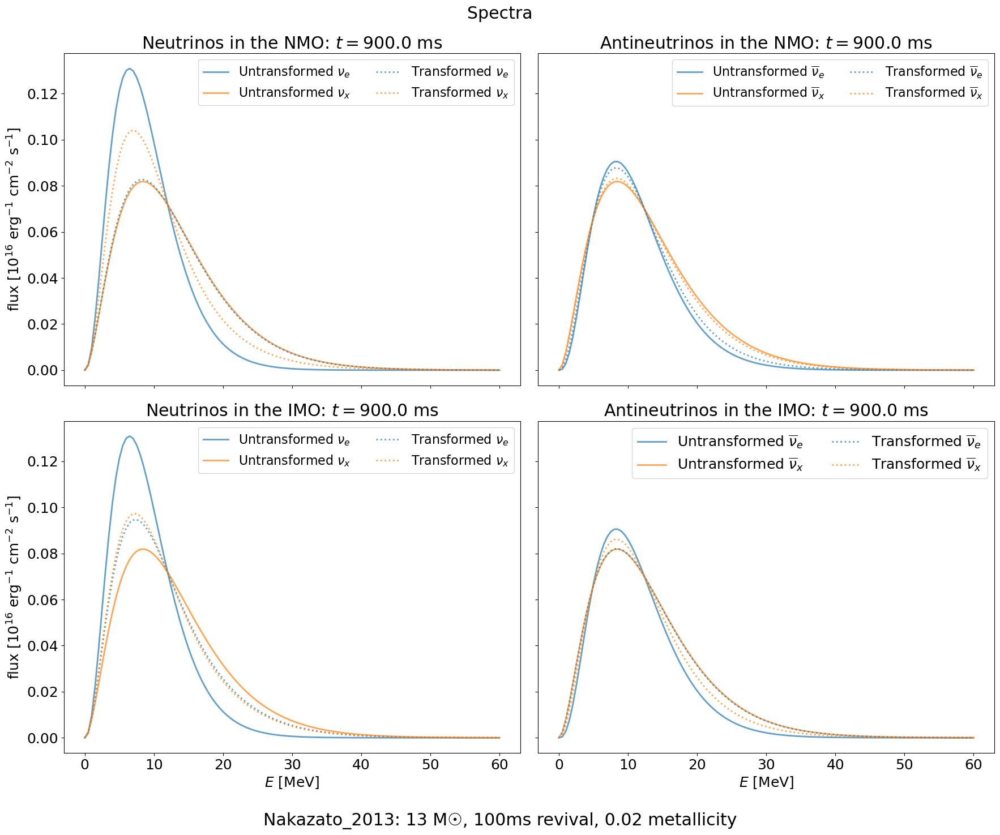

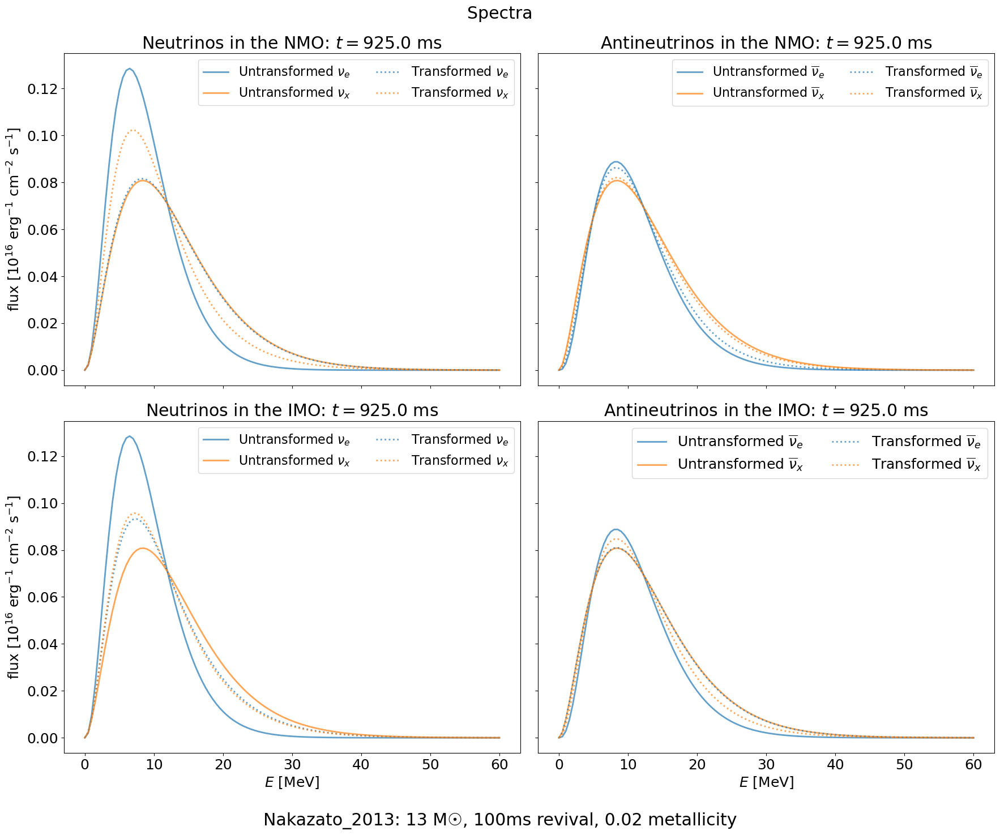

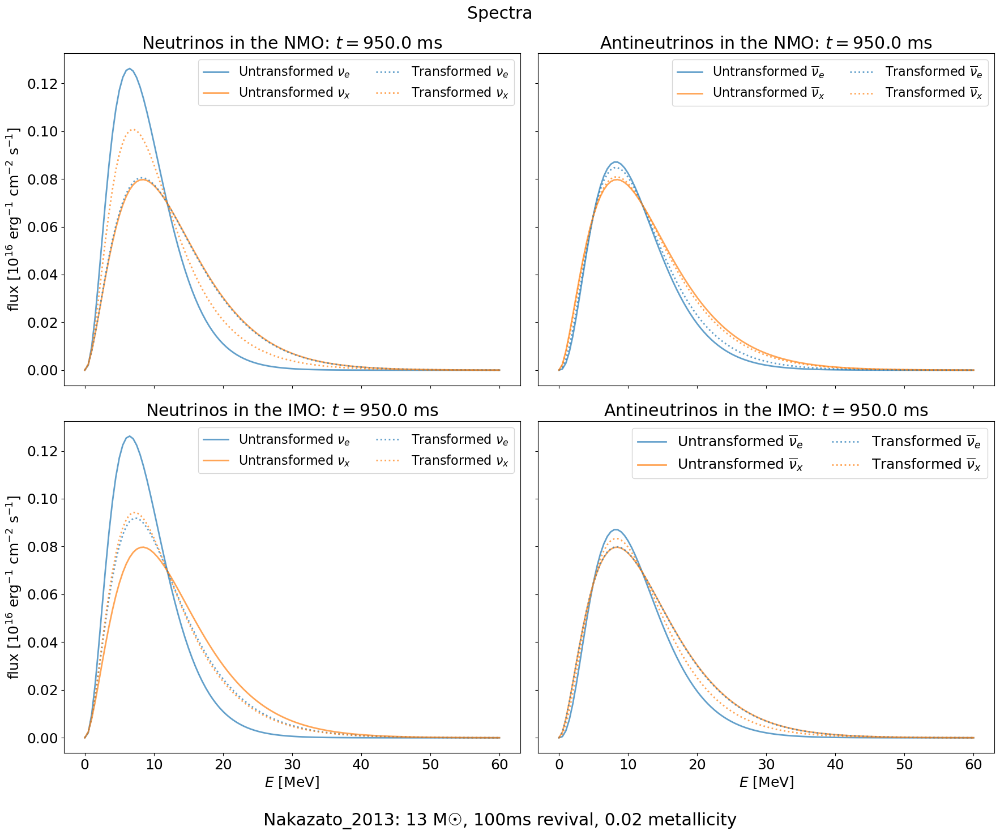

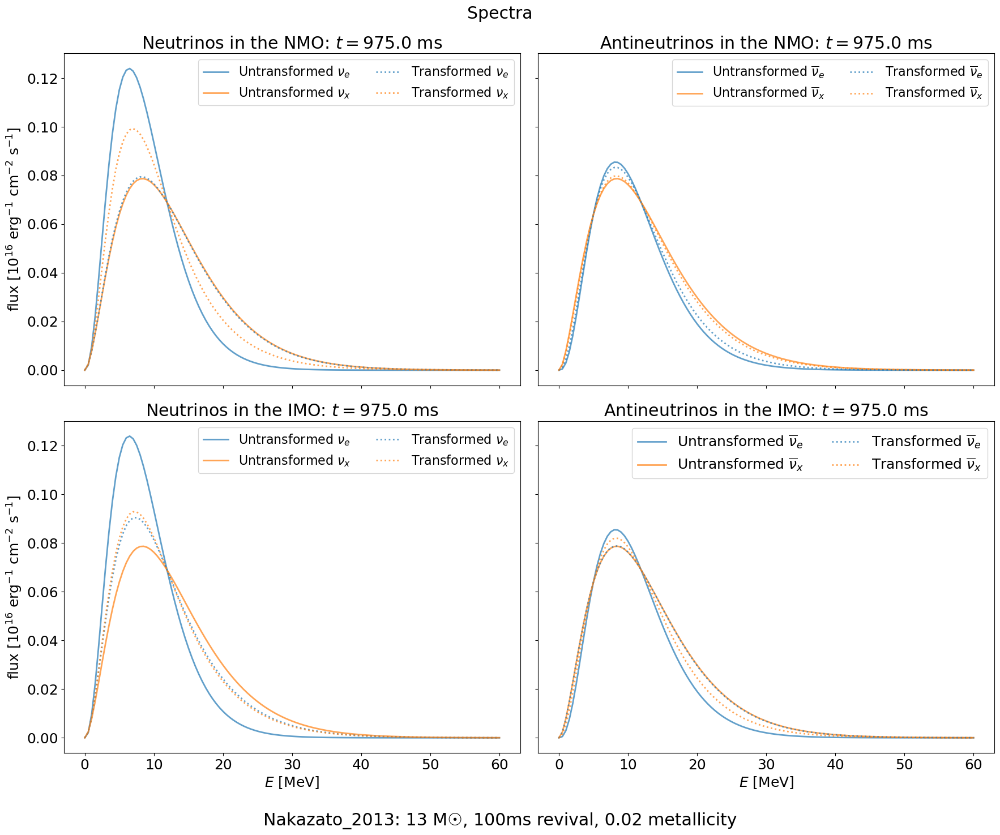

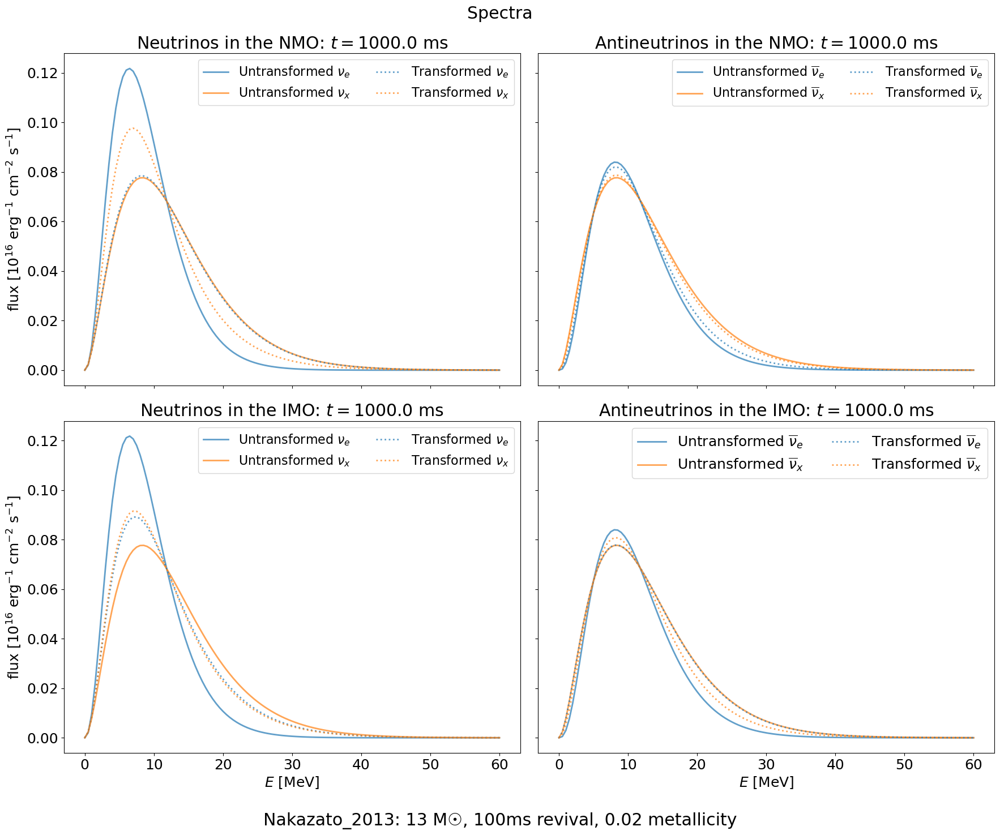

In [146]:
#assume all neutrinos have the same constant mass: therefore the time of flight distribution is proportional 
    #to the energy spectra
    
#try to animate how the energy dist changes over time?
fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 25*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic1.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 50*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic2.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 75*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic3.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 100*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic4.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 125*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic5.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 150*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic6.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 175*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic7.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 200*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic8.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 225*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic9.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 250*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic10.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 275*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic11.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 300*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic12.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 325*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic13.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 350*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic14.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 375*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic15.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 400*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic16.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 425*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic17.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 450*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic18.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 475*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic19.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 500*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic20.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 525*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic21.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 550*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic22.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 575*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic23.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 600*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic24.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 625*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic25.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 650*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic26.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 675*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic27.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 700*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic28.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 725*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic29.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 750*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic30.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 775*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic31.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 800*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic32.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 825*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic33.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 850*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic34.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 875*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic35.png')
fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 900*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic36.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 925*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic37.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 950*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic38.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 975*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic39.png')

fig = plot_spectra(model, AdiabaticMSW(), AdiabaticMSW(mh=MassHierarchy.INVERTED), 1000*u.ms)
fig.suptitle("Spectra")
fig.supxlabel("Nakazato_2013: 13 M☉, 100ms revival, 0.02 metallicity")
fig.savefig('spectra_Adiabatic40.png')